# Visão Computacional - 2a lista de exercícios

**Professor:** Thales Vieira

**Discentes:** Cauê Santos e Hellena Canuto

Nas questões 1, 2, 3 e 4, você será avaliado principalmente pela sua análise,
e não apenas pela implementação.

**Observações iniciais:** todos os algoritmos  de detectores e descritores possuem uma imagem como parâmetro, e os de geração de correspondências possuem duas imagens. Omitimos isso nos resumos e discussões por questões de simplicidade e de redução de espaço. 

Alguns questionamentos das Questões 1 e 2 só puderam ser explicados com mais detalhes na questão 3, visto que é onde geramos as correspondências e podemos avaliar, com mais informações, quão bem as features e detectores gerados funcionaram e quais problemas encontrados

## Imports necessários e otras cositas más

In [ ]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

In [ ]:
!git clone https://github.com/nothellena/computer-vision.git

Cloning into 'computer-vision'...
remote: Enumerating objects: 37, done.
remote: Counting objects: 100% (37/37), done.
remote: Compressing objects: 100% (32/32), done.
remote: Total 37 (delta 4), reused 27 (delta 3), pack-reused 0
Unpacking objects: 100% (37/37), 20.09 MiB | 7.87 MiB/s, done.


### Carregando as imagens

In [ ]:
def gamma_correction(gamma):
  lookup_table = np.zeros((1,256), np.uint8)
  for i in range(256):
      lookup_table[0,i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)

  return lookup_table

In [ ]:
def add_noise(img, noise_level=0.1):  
  gaussian_noise = np.random.normal(0, noise_level, img.size)
  gaussian_noise = gaussian_noise.reshape(img.shape).astype('uint8')
  noise = cv.add(img, gaussian_noise)
  return noise

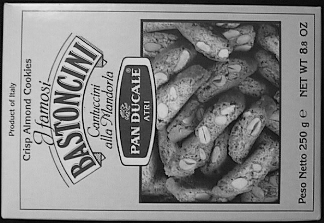

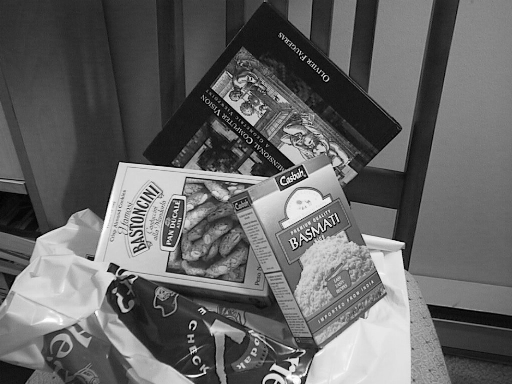

In [ ]:
# load the box images to test small rotation and scale changes, also oclusion
# and a gaussian noise
box1 = cv.imread("computer-vision/data/box.png",cv.IMREAD_GRAYSCALE)
box2 = cv.imread("computer-vision/data/box_in_scene.png",cv.IMREAD_GRAYSCALE)
box2 = add_noise(box2)

cv2_imshow(box1)
cv2_imshow(box2)

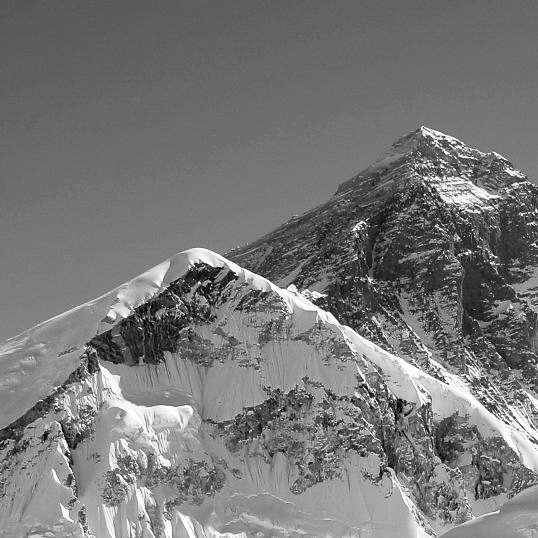

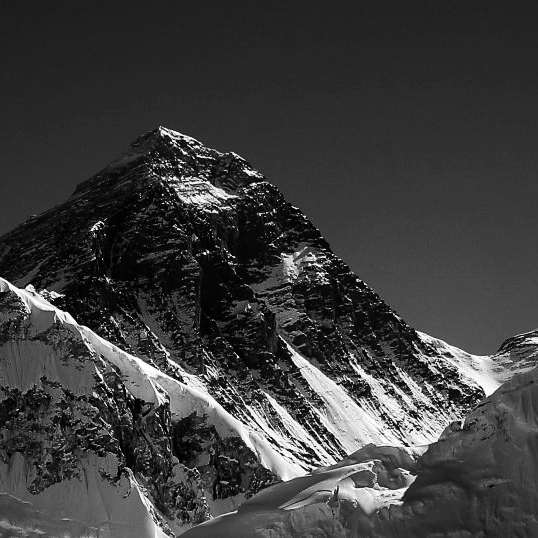

In [ ]:
# load the mountain images to test light variations
mountain1 = cv.imread("computer-vision/data/mountain.jpg",cv.IMREAD_GRAYSCALE)
mountain2 = mountain1[:, 800-538:]
mountain1 = mountain1[:, :538]

mountain1 = cv.LUT(mountain1, gamma_correction(0.67))
mountain2 = cv.LUT(mountain2, gamma_correction(1.5))

cv2_imshow(mountain1)
cv2_imshow(mountain2)

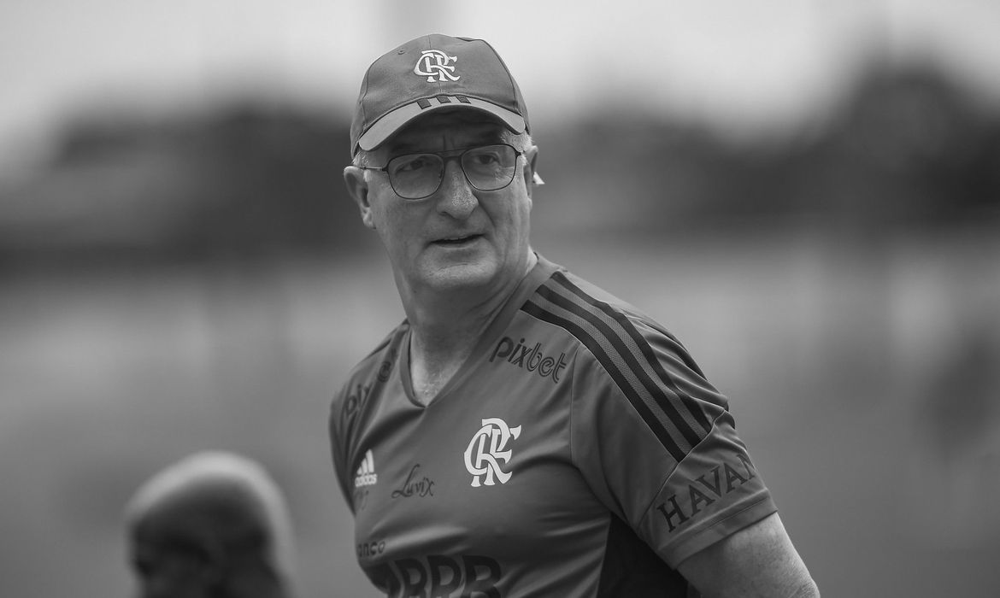

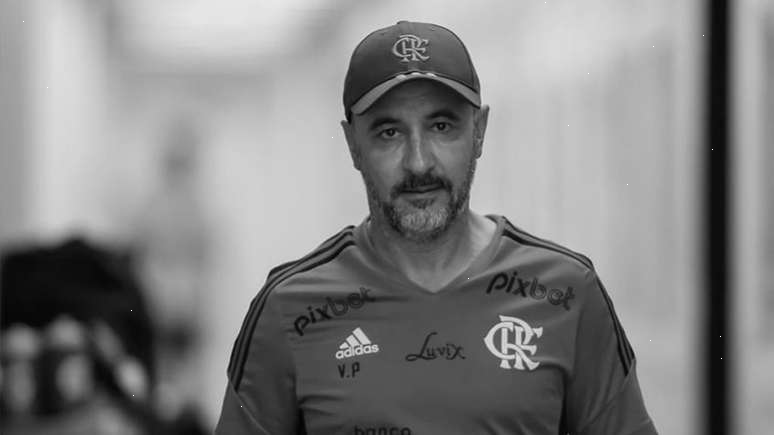

In [ ]:
# load vp images to test for high detailed images with high noise
vp1 = cv.imread("computer-vision/data/vp1.jpeg", cv.IMREAD_GRAYSCALE) 
vp2 = cv.imread("computer-vision/data/vp2.jpeg",cv.IMREAD_GRAYSCALE)
vp2 = add_noise(vp2, noise_level=0.25)

cv2_imshow(vp1)
cv2_imshow(vp2) 

## Questão 1
Na documentação da OpenCV é possível encontrar diversos detectores e descritores. Usando um conjunto com pelo menos 6 imagens (você pode tirar fotos com seu telefone, por exemplo), experimente três detectores distintos nestas imagens, incluindo o detector de Harris. Pesquise e descreva resumidamente com suas palavras (até 200 palavras para cada) como cada um funciona, incluindo seus parâmetros e quais suas principais diferenças. Exiba resultados nas suas imagens, e em quais situações cada um funciona bem ou mal. Discuta seus parâmetros. Qual deles você achou melhor? Justifique.


### Detectores

#### Detector de Harris
**Descrição resumida (até 200 palavras) de como este algoritmo funciona, incluindo seus parâmetros e quais suas principais diferenças:**

Para cada pixel da imagem, calcula autovalores e autovetores de blocos da imagem. Para tal, utiliza uma matriz de covariância do gradiente da imagem sobre a vizinhança do pixel em questão.

O algoritmo parte da premissa de que as quinas de uma imagem são os pontos com maior variação de intensidade nas direções $x$ e $y$. Ele funciona calculando primeiro o gradiente da imagem (através do operador de *Sobel*) e, em seguida, calculando a matriz de covariância $M$ desse gradiente, que dará a direção dos gradientes em cada pixel da imagem.

Segundo a premissa, uma quina teria gradientes altos nas duas direções, sendo essas direções perpendiculares. Ou seja, os autovalores $λ_1$ e $λ_2$ de $M$ são altos e não possuem uma diferença muito grande entre eles. Para identificar essas quinas, calcula-se um *corne score* $R$ de cada pixel da imagem de entrada, esse *score* mensura o quão provável é a existência de uma quina em um determinado pixel.

\begin{align}
  \mathrm{R} = \mathrm{det}(M) − k(\mathrm{trace}(M))^2 =  λ_1λ_2 - k(λ_1 + λ_2)^2
\end{align}

Por fim, as quinas da imagem poderem ser encontradas como máximos locais de $R$ (saída da função). Repare que esse resultado independe da rotação da imagem, sendo assim, o algoritmo invariante a rotação.

Seus parâmetros são:
- Tamanho da vizinhaça a ser considerada para a detecção das quinas.
- Tamanho do kernel usado para a derivada de *Sobel*.
- Parâmetro livre da equação. Uma constante empírica $k$ aonde $k ∈ [0.04, 0.06]$.

In [ ]:
def apply_harris(img, blockSize, ksize, k):
  # the algorithm requires a float32 single-channel image
  img_gray_f32 = np.float32(img)

  # image to store the Harris detector responses
  %timeit cv.cornerHarris(img_gray_f32, blockSize, ksize, k)
  dst = cv.cornerHarris(img_gray_f32, blockSize, ksize, k)

  # dilate the results to mark the corners
  dst = cv.dilate(dst, None)

  # threshold for an optimal value and mark the points in red
  img_rgb =  cv.cvtColor(img_gray_f32, cv.COLOR_GRAY2RGB)
  img_rgb[dst > 0.01 * dst.max()] = [0, 0, 255]

  cv2_imshow(img_rgb)

##### Applying it to the images

###### Box pair

767 µs ± 41.9 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


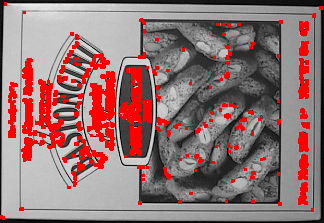

2.06 ms ± 438 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


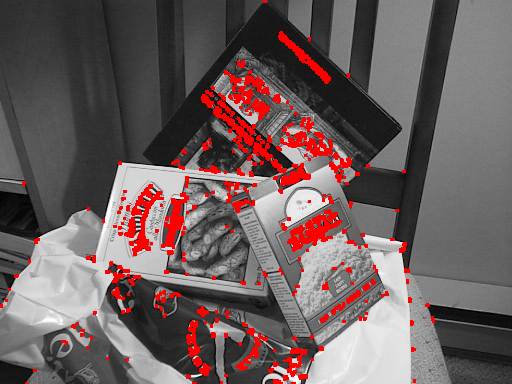

In [ ]:
apply_harris(box1, 2, 3, 0.04)
apply_harris(box2, 2, 3, 0.04)

###### Mountain pair

5.01 ms ± 133 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


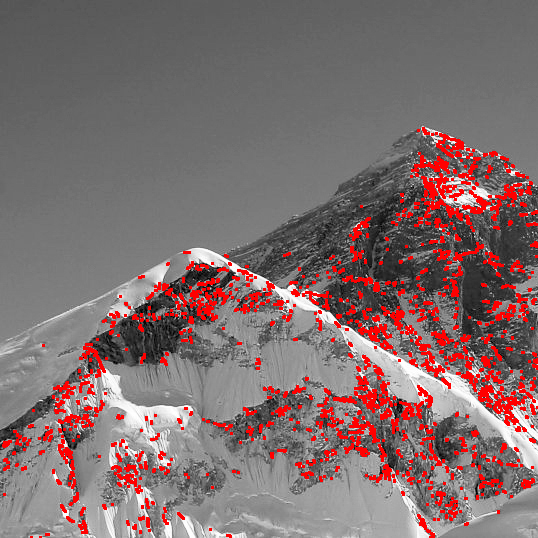

5.38 ms ± 570 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


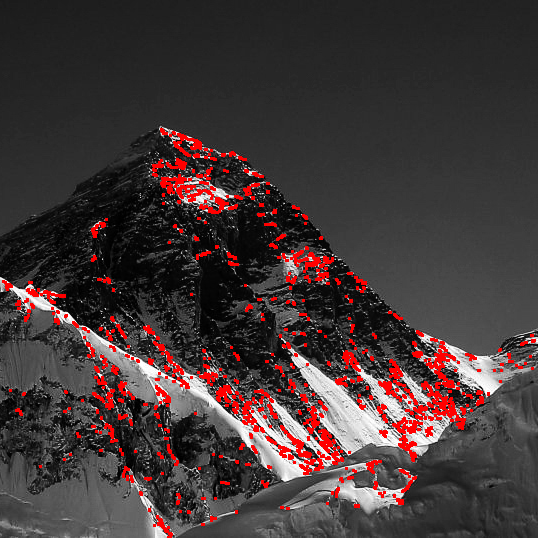

In [ ]:
apply_harris(mountain1, 2, 11, 0.1)
apply_harris(mountain2, 2, 11, 0.1)

###### VP pair

13.3 ms ± 722 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


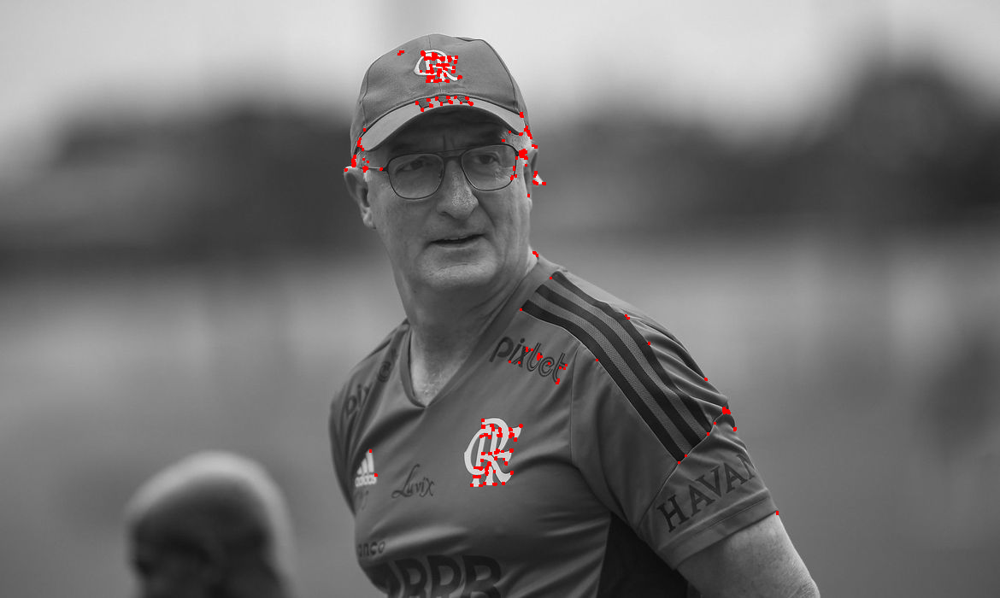

2.95 ms ± 76 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


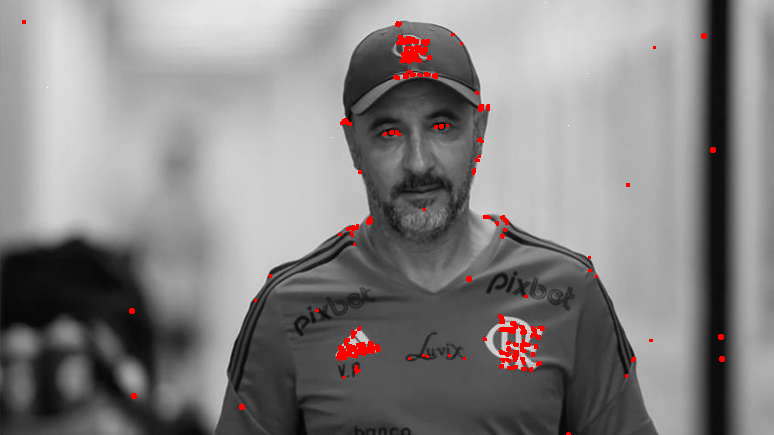

In [ ]:
apply_harris(vp1, 2, 3, 0.04)
apply_harris(vp2, 2, 3, 0.04)

#### Detector *SIFT (Scale-Invariant Feature Transform)*
**Descrição resumida (até 200 palavras) de como este algoritmo funciona, incluindo seus parâmetros e quais suas principais diferenças:**

Com o objetivo de ser invariante a escala, diferente de Harris, a ideia do algoritmo é usar diferentes tamanhos de janelas para identificar blops em diferentes escalas de imagem. Para isso, por motivos de otimização, usa-se Diferença de Guassianas (DoG), que é uma aproximação da Laplaciana da Gaussiana (LoG). DoG é obtida através da diferença entre uma versão de uma determinada imagem borrada com um filtro gaussiano $σ$ e outra versão da mesma imagem borrada por um filtro gaussiano $kσ$. Esse processo é então feito em diferentes octavos da imagem em uma Pirâmide Gaussiana.

Após isso, procura-se por máximos locais em DoG, que é um espaço de três dimensões: as duas primeiras são as dimensões da imagem, $x$ e $y$, e a terceira é $σ$, representando a escala. Após isso, elimina-se pontos máximos cuja intensidade não for superior a um threshold de contraste, também é usado um processo similar ao identificador de Harris e um threshold de arestas para remover as arestas que não são quinas, os pontos identificados são chamados de keypoints.

Para ser invariante à rotação, cada keypoint recebe uma orientação, calculada utilizando um histograma das orientações do gradiente.

Seus parâmetros são:
- Número de features a se manter
- Número de camadas em cada octavo
- $σ$ inicial
- threshold de contraste
- threshold de arestas

In [ ]:
def apply_sift(img, nfeatures=0, nOctaveLayers=3, contrastThreshold=0.09,
               edgeThreshold=10, sigma=1.6):
  # instancia o SIFT com os seguintes parâmetros
  sift = cv.SIFT.create(nfeatures,
                        nOctaveLayers,
                        contrastThreshold,
                        edgeThreshold,
                        sigma)

  # encontra os keypoints
  %timeit sift.detect(img, None)
  kp = sift.detect(img, None)

  # desenha os keypoints 
  img_kp = cv.drawKeypoints(img,
                            kp,
                            None,
                            flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  cv2_imshow(img_kp)
  return kp

##### Applying it to the images

###### Box pair

12.4 ms ± 1.76 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)


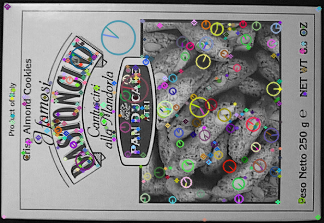

44.4 ms ± 860 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


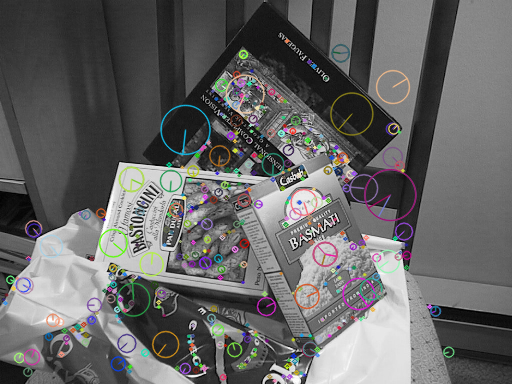

In [ ]:
sift_box1 = apply_sift(box1, nfeatures=0, nOctaveLayers=3, 
                       contrastThreshold=0.09, edgeThreshold=10, sigma=1.6)
sift_box2 = apply_sift(box2, nfeatures=0, nOctaveLayers=3, 
                       contrastThreshold=0.09, edgeThreshold=10, sigma=1.6)

###### Mountain pair

95.5 ms ± 15.1 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


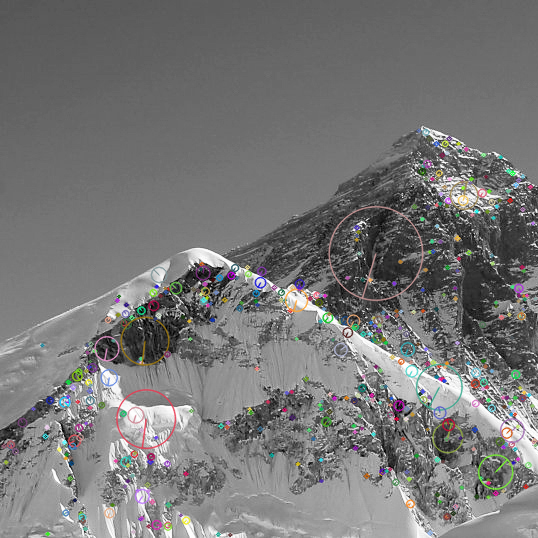

95.1 ms ± 12.8 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


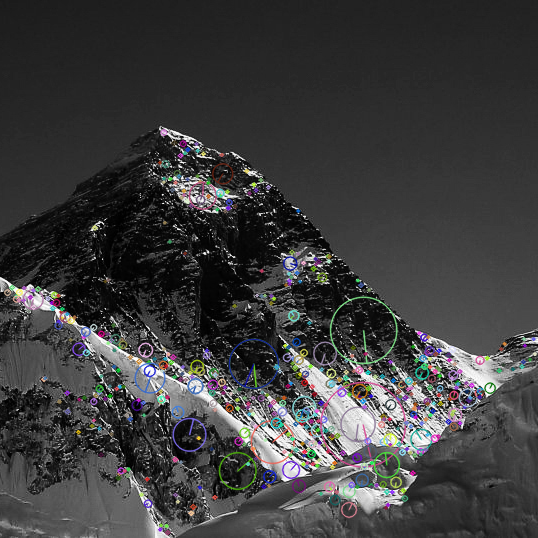

In [ ]:
sift_mountain1 = apply_sift(mountain1, nfeatures=0, nOctaveLayers=7, 
                            contrastThreshold=0.1, edgeThreshold=10, sigma=2.2)
sift_mountain2 = apply_sift(mountain2, nfeatures=0, nOctaveLayers=7, 
                            contrastThreshold=0.1, edgeThreshold=10, sigma=2.2)

###### VP pair

213 ms ± 46.7 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


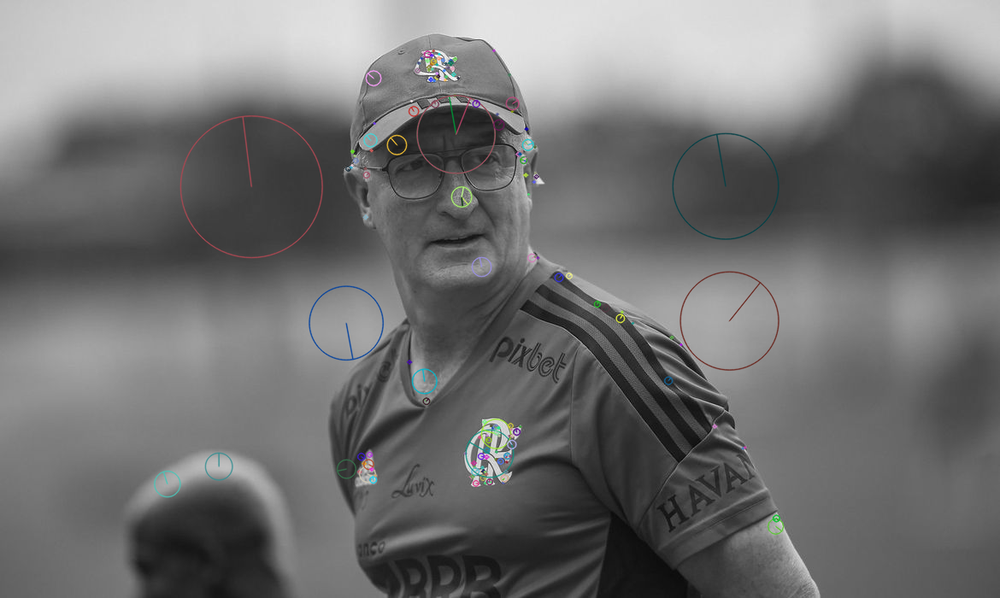

79.8 ms ± 877 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


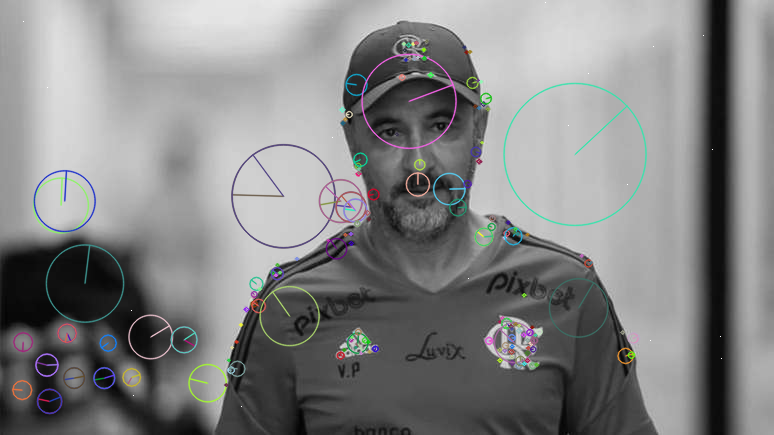

In [ ]:
sift_vp1 = apply_sift(vp1, nfeatures=0, nOctaveLayers=5, contrastThreshold=0.09,
                      edgeThreshold=10, sigma=1.6)
sift_vp2 = apply_sift(vp2, nfeatures=0, nOctaveLayers=5, contrastThreshold=0.09,
                      edgeThreshold=12, sigma=2)

#### Detector *FAST (Features from Accelerated Segment Test) Algorithm*
**Descrição resumida (até 200 palavras) de como este algoritmo funciona, incluindo seus parâmetros e quais suas principais diferenças:**

Um problema dos detectores citados anteriormente é que eles não são rápidos o suficiente para uma aplicação em tempo real. O detector FAST foi desenvolvido para ser uma solução para esse problema.

Dado um pixel $p$ com intensidade $I_p$ em uma dada imagem, queremos determinar se ele é um keypoint. Para isso, seleciona-se um círculo $c$ de 16 pixeis contínuos (vizinhança $d8$) de raio 3 centralizado no pixel $p$. Este será uma quina se existir $n$ pixeis contínuos em $c$ que possuam intensidade maior que $I_p + t$ ou menor que $I_p - t$, onde $t$ é um threshold arbitrário.

Para excluir um alto número de não-quinas, realiza-se um teste rápido que examina somente 4 dos 16 pixeis (os 4 localizados nos 4 pontos cardeais) onde $p$ não será uma quina se pelo menos dois desses pixeis não tiverem intensidade maior que $I_p + t$ ou menor que $I_p - t$. O teste completo é realizado nos pixeis que passarem nesse teste rápido.

Esse algoritmo apresenta algumas falhas, que tipicamente são resolvidas com Aprendizado de Máquina e Supressão Não-Máxima. Essa última serve para resolver o problema de features adjacentes. Mesmo assim, o FAST não é robusto a ruídos, e determinar um threshold correto pode ser um problema

Parâmetros:
- threshold,
- nonmaxSuppression
- tipo de vizinhança

In [ ]:
def apply_fast(img, threshold=10, nonmaxSuppression=True,
               dist_type=cv.FAST_FEATURE_DETECTOR_TYPE_5_8):
  # Initiate FAST object with default values
  fast = cv.FastFeatureDetector_create(threshold,
                                      nonmaxSuppression,
                                      type=dist_type)
  # encontra os keypoints
  %timeit fast.detect(img, None)
  kp = fast.detect(img, None)

  # desenha os keypoints
  img_kp = cv.drawKeypoints(img,
                            kp,
                            None,
                            color=(0,0,255))

  cv2_imshow(img_kp)

##### Applying it to the images

###### Box pair

281 µs ± 9.35 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


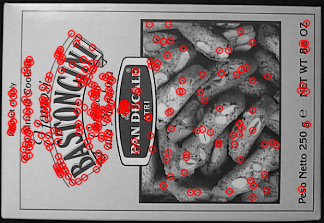

698 µs ± 100 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


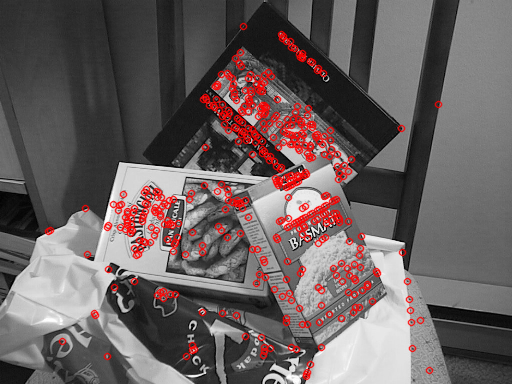

In [ ]:
apply_fast(box1, threshold=24, nonmaxSuppression=True,
           dist_type=cv.FAST_FEATURE_DETECTOR_TYPE_5_8)
apply_fast(box2, threshold=18, nonmaxSuppression=True,
           dist_type=cv.FAST_FEATURE_DETECTOR_TYPE_5_8)

###### Mountain pair

786 µs ± 45.7 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


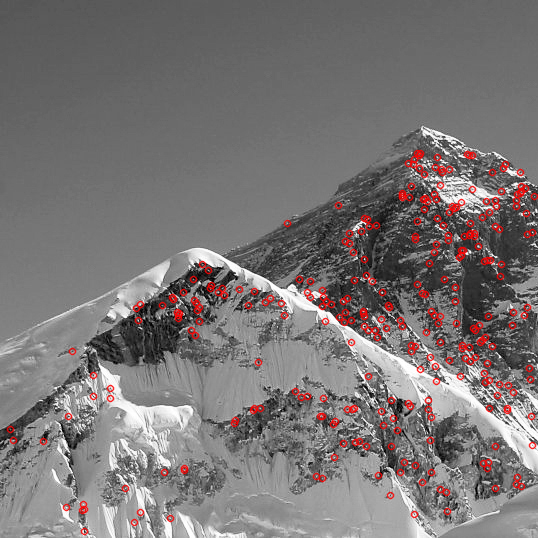

724 µs ± 6.41 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


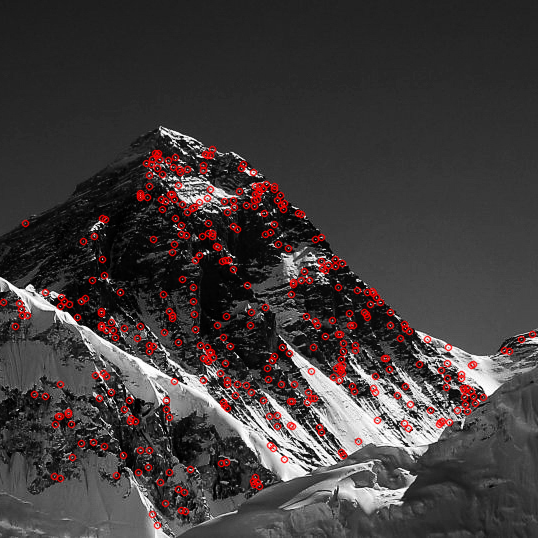

In [ ]:
apply_fast(mountain1, threshold=42, nonmaxSuppression=True,
           dist_type=cv.FAST_FEATURE_DETECTOR_TYPE_5_8)
apply_fast(mountain2, threshold=56, nonmaxSuppression=True,
           dist_type=cv.FAST_FEATURE_DETECTOR_TYPE_5_8)

###### VP pair

1.51 ms ± 232 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


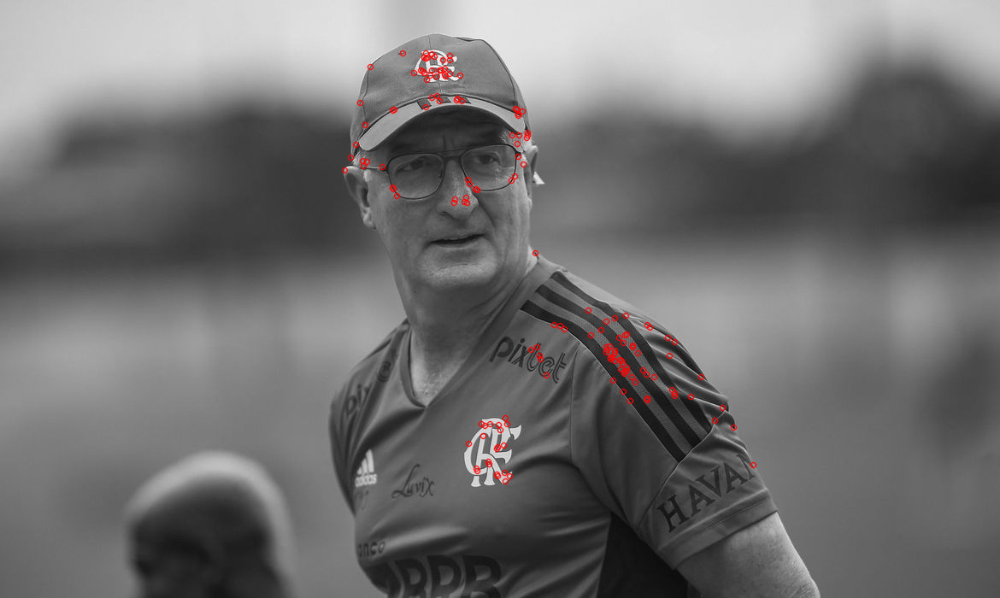

764 µs ± 157 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


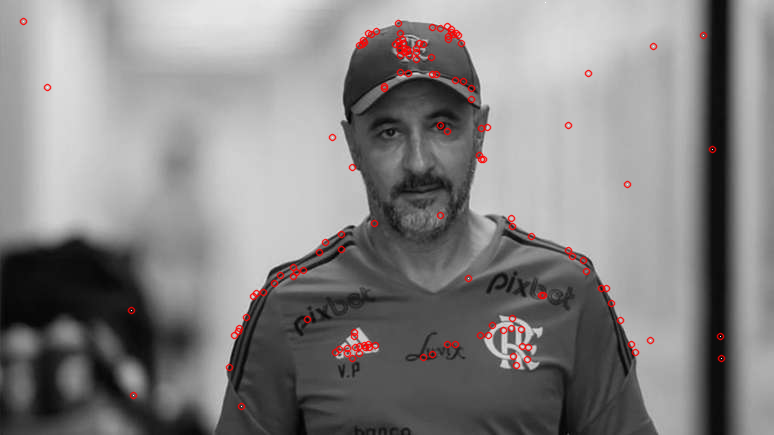

In [ ]:
apply_fast(vp1, threshold=16, nonmaxSuppression=True,
           dist_type=cv.FAST_FEATURE_DETECTOR_TYPE_5_8)
apply_fast(vp2, threshold=8, nonmaxSuppression=True,
           dist_type=cv.FAST_FEATURE_DETECTOR_TYPE_5_8)

### Discussão
Exiba resultados nas suas imagens, e em quais situações cada um funciona bem ou mal. Discuta seus parâmetros. Qual deles você achou melhor? Justifique.

**Quais situações cada um funciona bem ou mal:**
- **Harris:** O algoritmo é invariante à rotação e funciona bem em situações com pouca ou nenhuma variação na escala e quando o tempo de resposta não é crítico. Pareceu funcionar melhor em imagens com quinas significativas, não me parece que funcione tão bem no caso da montanha, mas não dá para ter certeza sem realizar o match.
- **SIFT:** O algoritmo é invariante à rotação e a escala e funciona bem nessa situações, funcionando mal quando a aplicação é em tempo real, repare que ele teve o tempo de execução mais longo dos três. Me pareceu funcionar melhor em situações com existência de blops, como no caso do terceiro par de imagens, ele identificou alguns pontos que os demais não identificaram. A vizualização dos keypoints não foi tão fácil quanto os dos demais.
- **FAST:** É adequado quando se trata de uma aplicação em tempo real, contudo funciona mal quando se há ruídos na imagem. Foi o algoritmo que menos conseguiu identificar features no escudo do flamengo no terceiro par de imagens, identificando um número relativamente alto nas linhas localizadas no ombro da camisa. Me pareceu ter a pior identificaçao de quina dos três e deixou passar mais arestas que os demais. 

**Discussão de parâmetros:**
- **Harris:** Possui um número de parâmetros intermediário entre os outros dois. O autor do algoritmo especificou sugestões de parâmetros com base em experiências, incluindo o do parâmetro livre $k$. O tamanho do bloco impacta na proximidade entre as features detectadas, já o tamanho do kernel de sobel influencia no borramento da imagem, para um kernel maior tem-se que a quantidade de quinas irá diminuir, podendo chegar em zero se for alto o suficiente. Notamos pouca variação ao manter a constante empírica dentro do indicado pelo autor, ao passar desse intervalo, notamos que valores muito altos diminuiam consideravelmente (ou zeravam) o número de features, e valores muito baixos, aumentavam. No primeiro e terceiro pares de images (caixa e VP) achamos que o valor sugerido caiu bem, aumentando fez algumas correspondências no interior da caixa sumirem e diminuindo fez aparecer valores demais na do VP. Esses mesmos valores no segundo (montanha), retornaram um número muito grande de features e muitas delas próximas umas das outras, selecionamos os valores empiricamente, após rodadas de testes.
- **SIFT:** Possui um número considerável de parâmetros, o autor do algoritmo especificou sugestões de parâmetros com base em experiências. Mantivemos o número de features em 0 para que o algoritmo retornasse todas encontradas, ao aumentar os thresholds notamos que o número de keypoints caia consideravelmente, mesmo com uma mudança singela. O inverso é válido, brincamos mais com esses valores nas imagens das montanhas, o valor sugerido ficou bom ou fizemos uma mudança muito pequena nos outros dois pares. Similar ao que fizemos no de Harris, mexemos na suavização da imagem ($σ$) no par das montanhas e um pouco no do VP, esse pouco foi o suficiente para reduzir o número de keypoints para que os que restassem fossem significativos no nosso pont de vista, como por exemplo nas linhas da manga da camisa, que parecem estar em posição similar nas duas. O número de camadas em cada octavo não alterou tão significativamente quanto os demais parâmetros, mexemos um pouco mais no das montanhas.
- **FAST:** possui poucos parâmetros, e, tirando o threshold, poucas combinações possíveis. Contudo identificar o threshold correto pode ser algo difícil. Foi o algoritmo que retornou mais pontos com os parâmetros iniciais.Notamos que uma vizinhança maior que $d_5$ retornava um número muito elevado de features, e que mesmo com Supressão Não-Máxima, o número de features próximas umas das outras era alto, utilizamos essa supressão para todos os casos. Por fim, o threshold foi o parâmetro que apresentou um maior impacto na detecção, e tivemos que buscá-lo de forma empírica para cada uma das imagens. 

**Qual achei melhor:**
Para situações em que o tempo de resposta não é crítico, o SIFT e o Harris são melhores opções que o FAST, SIFT é invariante à escala e é melhor para identificar blops, sendo mais robusto se não se tem controle das imagens de entrada, se consegue-se garantir que não haverá variação na escala e as imagens não possuem estruturas de blops, Harris me parece um melhor candidato. Contudo se é uma aplicação de tempo real, o FAST é mais adequado.

## Questão 2
Repita o mesmo procedimento acima para 3 tipos de descritores,
incluindo o SIFT.


### Descritores

#### Descritor *SIFT (Scale-Invariant Feature Transform)*
**Descrição resumida (até 200 palavras) de como este algoritmo funciona, incluindo seus parâmetros e quais suas principais diferenças:**

Primeiro, realiza-se uma amostra das magnitudes e orientações do gradiente de uma imagem em torno do keypoint, usando sua escala $σ$ para selecionar o nível de desfoque gaussiano. Para alcançar invariância a orientação, o descritor e as orientações do gradiente são rotacionados em relação a orientação do keypoint.Uma função de ponderação gaussiana é usada para atribuir um peso à magnitude de cada ponto de amostra, evitando mudanças abruptas no descritor e dando menos ênfase a gradientes longe do centro do descritor.

Os gradientes são agrupados em histogramas de orientação em regiões de amostra de 4x4 com 8 bins em cada, com interpolação trilinear usada para distribuir os valores nas regiões adjacentes. Isso resulta em um vetor de features de 128 elementos para cada keypoint. O vetor de features é normalizado para reduzir os efeitos da mudança de iluminação, limitando seus valores a não mais que 0,2 e, em seguida, normalizando novamente para o comprimento unitário.

Parâmetros:
- Tipo do descritor (CV_32F ou CV_8U) 

In [ ]:
def sift_descriptor(img, nfeatures=0, nOctaveLayers=3, contrastThreshold=0.09,
                    edgeThreshold=10, sigma=1.6):

  sift = cv.SIFT.create(nfeatures,
                        nOctaveLayers,
                        contrastThreshold,
                        edgeThreshold,
                        sigma)
  
  # encontra os keypoints e os descritores
  %timeit sift.detectAndCompute(img, None)
  kp, des = sift.detectAndCompute(img, None)

  print("Foram encontrados %(n_des)d descritores de %(n_dim)d dimensões cada" % \
        {"n_des": des.shape[0], "n_dim": des.shape[1]})
  return (kp, des)

##### Applying it to the images

###### Box pair

In [ ]:
# using the same parameters of the Question 1
_ = sift_descriptor(box1, nfeatures=0, nOctaveLayers=3, contrastThreshold=0.09,
                    edgeThreshold=10, sigma=1.6)
_ = sift_descriptor(box2, nfeatures=0, nOctaveLayers=3, contrastThreshold=0.09,
                    edgeThreshold=10, sigma=1.6)

20.1 ms ± 2.71 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)
Foram encontrados 372 descritores de 128 dimensões cada
57.9 ms ± 715 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)
Foram encontrados 560 descritores de 128 dimensões cada


###### Mountain pair

In [ ]:
# using the same parameters of the Question 1
_ = sift_descriptor(mountain1, nfeatures=0, nOctaveLayers=7,
                    contrastThreshold=0.1, edgeThreshold=10, sigma=2.2)
_ = sift_descriptor(mountain2, nfeatures=0, nOctaveLayers=7,
                    contrastThreshold=0.1, edgeThreshold=10, sigma=2.2)

116 ms ± 24.8 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
Foram encontrados 621 descritores de 128 dimensões cada
99.7 ms ± 16 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
Foram encontrados 662 descritores de 128 dimensões cada


###### VP pair

In [ ]:
# using the same parameters of the Question 1
_ = sift_descriptor(vp1, nfeatures=0, nOctaveLayers=5, contrastThreshold=0.09,
                    edgeThreshold=10, sigma=1.6)
_ = sift_descriptor(vp2, nfeatures=0, nOctaveLayers=5, contrastThreshold=0.09,
                    edgeThreshold=12, sigma=2)

163 ms ± 12.6 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
Foram encontrados 215 descritores de 128 dimensões cada
62.5 ms ± 795 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)
Foram encontrados 215 descritores de 128 dimensões cada


#### Descritor *BRIEF (Binary Robust Independent Elementary Features)*
**Descrição resumida (até 200 palavras) de como este algoritmo funciona, incluindo seus parâmetros e quais suas principais diferenças:**

SIFT gera descritores de 128 dimensões que, se de pontos flutuantes, ocupam 512 bytes cada. Criar um vetor desses para milhares de features ocupa muita memória, o que não é viável para aplicações com restrição de recursos

Sem grande perda, podemos comprimir esse vetor para strings binárias e utilizá-las para gerar correspondências utilizando Distância de Hamming. Promovendo um ganho de velocidade considerável, já que para o cálculo dessa distância basta uma operação de XOR e contagem de bits.

BRIEF permite achar diretamente essas strings binárias sem ter que achar esses descritores. Ele recebe um patch desfocado da imagem e seleciona um conjunto de $n_d$ pares $(x,y)$. Então, realiza-se comparações de intensidade entre esses pares, como por exemplo, dado um par $p$ e $q$, se $I_p < I_q$, o resultado é 1, caso contrário, é 0. Isso é aplicado para todos os pares para obter uma string binária de $n_d$ dimensões. O $n_d$ padrão é 256 (32 bytes).

Caso não haja uma grande rotação no plano, BRIEF consegue fornecer alta taxa de reconhecimento.

Parâmetros
- Tamanho do descritor em bytes
- Ammostragem dos padrões usando a orientação dos keypoints

In [ ]:
def brief_descriptor(img, kp, bytes=32, use_orientation=False):
  # instancia o descritor BRIEF
  brief = cv.xfeatures2d.BriefDescriptorExtractor_create(bytes, use_orientation)

  # computa os descritores
  %timeit brief.compute(img, kp)
  kp, des = brief.compute(img, kp)

  print("Foram encontrados %(n_des)d descritores de %(n_dim)d dimensões cada" % \
        {"n_des": des.shape[0], "n_dim": des.shape[1]})

##### Applying it to the images

###### Box pair

In [ ]:
brief_descriptor(box1, kp=sift_box1, bytes=32, use_orientation=True)
brief_descriptor(box2, kp=sift_box2, bytes=32, use_orientation=True)

1.28 ms ± 147 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)
Foram encontrados 317 descritores de 32 dimensões cada
2.07 ms ± 47.8 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)
Foram encontrados 510 descritores de 32 dimensões cada


###### Mountain pair

In [ ]:
brief_descriptor(mountain1, kp=sift_mountain1, bytes=32, use_orientation=True)
brief_descriptor(mountain2, kp=sift_mountain2, bytes=32, use_orientation=True)

3.28 ms ± 393 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)
Foram encontrados 525 descritores de 32 dimensões cada
2.54 ms ± 18.9 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)
Foram encontrados 635 descritores de 32 dimensões cada


###### VP pair

In [ ]:
brief_descriptor(vp1, kp=sift_vp1, bytes=32, use_orientation=True)
brief_descriptor(vp2, kp=sift_vp2, bytes=32, use_orientation=True)

1.26 ms ± 160 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)
Foram encontrados 215 descritores de 32 dimensões cada
954 µs ± 13.6 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)
Foram encontrados 213 descritores de 32 dimensões cada


#### Descritor *ORB (Oriented FAST and Rotated BRIEF)*
**Descrição resumida (até 200 palavras) de como este algoritmo funciona, incluindo seus parâmetros e quais suas principais diferenças:**

Até 2020 SIFT era patentado, dificultando seu uso em algumas situações. O ORB, não patenteado, é basicamente uma mistura do detector FAST e do descritor BRIEF com várias alterações que visam aumentar sua performance e invariância.

Primeiro, utiliza-se FAST para achar os keypoints, então calcula-se um *corne score* (como o de Harris, por exemplo) para encontrar os $n$ melhores keypoints. Também utiliza-se de Pirâmide Gaussiana para encontrar features em diferentes escalas. Para computar a orientação, calcula-se a direção do vetor que vai do ponto da quina até o centroid da intensidade ponderada do patch dessa quina

Realiza-se então um BRIEF orientado de acordo com a orientação dos keypoints, tornando-se invariante à rotação. Por fim, ORB realiza uma busca gulosa entre todos os possíveis testes binários para encontrar aqueles que possuem alta variância e médias próximas de 0,5, além de serem não correlacionados. O resultado é chamado de rBRIEF.

Parâmetros
- Número máximo de features,
- Fator de decaimento da Pirâmide Gaussiana,
- Número de níveis da Pirâmide,
- Tamanho da borda onde as features não serão detectadas,
- Nível da pirâmide da imagem original,
- Número de pontos que produz cada elemento do descritor BRIEF orientado
- Tipo de *corne score*,
- Tamanho do patch utilizado pelo descritor BRIEF
- Threshold do FAST = 20 

In [ ]:
def orb_descriptor(img, nfeatures=264, scaleFactor=1.2, nlevels=8,
                   edgeThreshold=32, firstLevel=0, WTA_K=2,
                   scoreType=cv.ORB_HARRIS_SCORE, patchSize=32,
                   fastThreshold=20, display=True):
  
  # instancia o ORB com os seguintes parâmetros
  orb = cv.ORB_create(nfeatures,
                      scaleFactor,
                      nlevels,
                      edgeThreshold,
                      firstLevel,
                      WTA_K,
                      scoreType,
                      patchSize,
                      fastThreshold)

  # encontra os keypoints
  kp = orb.detect(img,None)

  # computa os descritores
  %timeit orb.compute(img, kp)
  kp, des = orb.compute(img, kp)
  
  # desenha os keypoints 
  img_kp = cv.drawKeypoints(img,
                            kp,
                            None,
                            #color=(255, 0, 0),
                            flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  if display:
    cv2_imshow(img_kp)
    print("Foram encontrados %(n_des)d descritores de %(n_dim)d dimensões cada" % \
          {"n_des": des.shape[0], "n_dim": des.shape[1]})

  return (kp, des)

##### Applying it to the images

###### Box pair

1.48 ms ± 173 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


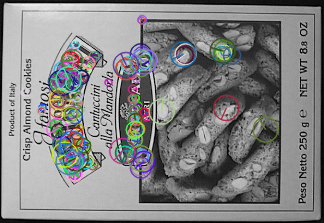

Foram encontrados 250 descritores de 32 dimensões cada
2.49 ms ± 238 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


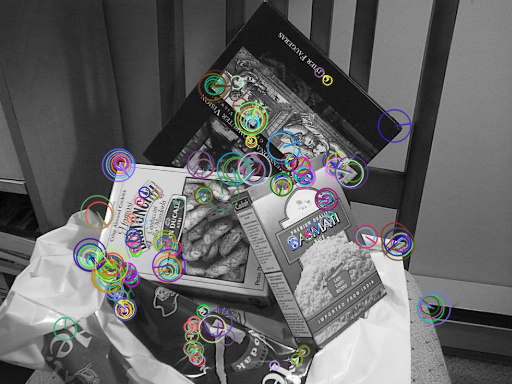

Foram encontrados 250 descritores de 32 dimensões cada


In [ ]:
kp_box1, des_box1 = orb_descriptor(box1, nfeatures=250, scaleFactor=1.2, 
                                   nlevels=8, edgeThreshold=14, firstLevel=0, 
                                   WTA_K=2, scoreType=cv.ORB_HARRIS_SCORE, 
                                   patchSize=7, fastThreshold=24)
kp_box2, des_box2 = orb_descriptor(box2, nfeatures=250, scaleFactor=1.2, 
                                   nlevels=8, edgeThreshold=18, firstLevel=0, 
                                   WTA_K=2, scoreType=cv.ORB_HARRIS_SCORE, 
                                   patchSize=9, fastThreshold=24)

###### Mountain pair

2.94 ms ± 547 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


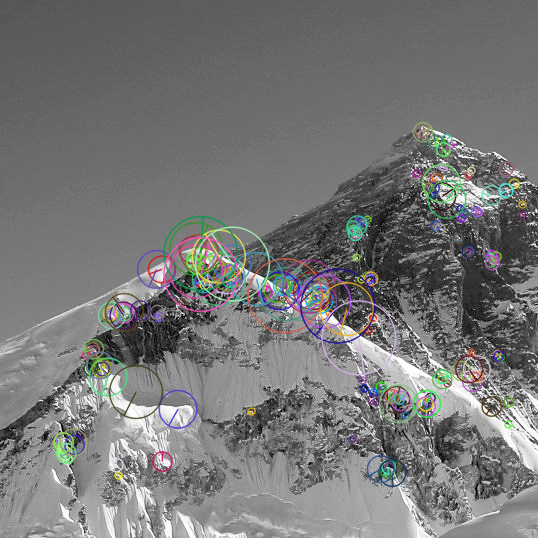

Foram encontrados 249 descritores de 32 dimensões cada
2.26 ms ± 29.6 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


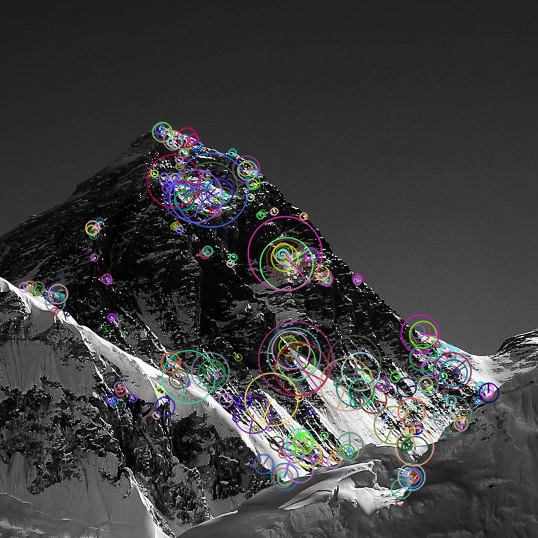

Foram encontrados 246 descritores de 32 dimensões cada


In [ ]:
kp_mtn1, des_mtn1 = orb_descriptor(mountain1, nfeatures=250, scaleFactor=1.4, 
                                   nlevels=8, edgeThreshold=15, firstLevel=0, 
                                   WTA_K=2, scoreType=cv.ORB_HARRIS_SCORE, 
                                   patchSize=7, fastThreshold=42)
kp_mtn2, des_mtn2 = orb_descriptor(mountain2, nfeatures=250, scaleFactor=1.4, 
                                   nlevels=8, edgeThreshold=15, firstLevel=0, 
                                   WTA_K=2, scoreType=cv.ORB_HARRIS_SCORE, 
                                   patchSize=7, fastThreshold=56)

###### VP pair

6.45 ms ± 124 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


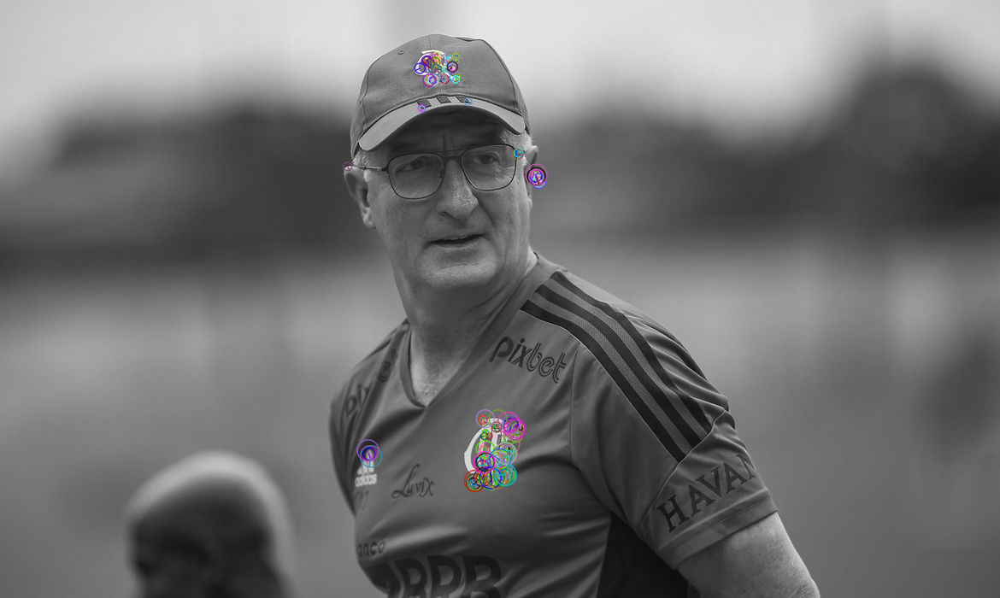

Foram encontrados 200 descritores de 32 dimensões cada
4.59 ms ± 1.24 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)


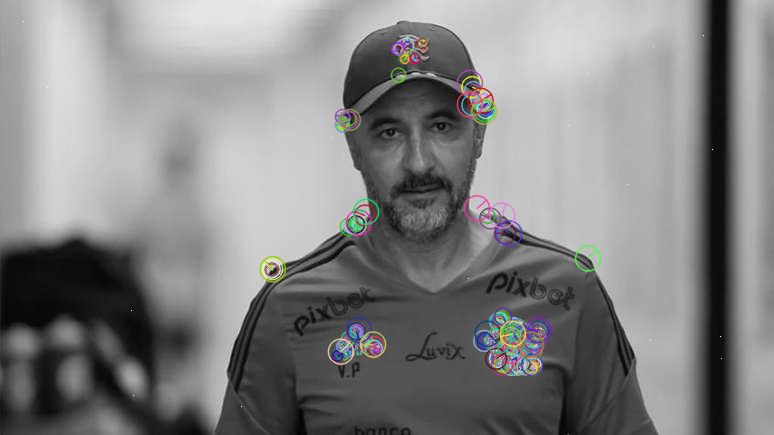

Foram encontrados 320 descritores de 32 dimensões cada


In [ ]:
kp_vp1, des_vp1 = orb_descriptor(vp1, nfeatures=200, scaleFactor=1.2, 
                                 nlevels=8, edgeThreshold=21, firstLevel=0, 
                                 WTA_K=2, scoreType=cv.ORB_HARRIS_SCORE, 
                                 patchSize=7, fastThreshold=16)
kp_vp2, des_vp2 = orb_descriptor(vp2, nfeatures=320, scaleFactor=1.2, 
                                 nlevels=8, edgeThreshold=21, firstLevel=0, 
                                 WTA_K=2, scoreType=cv.ORB_HARRIS_SCORE, 
                                 patchSize=7, fastThreshold=14)

### Discussão
Exiba resultados nas suas imagens, e em quais situações cada um funciona bem ou mal. Discuta seus parâmetros. Qual deles você achou melhor? Justifique.

Não conseguimos pensar uma maneira de exibir os descritores na imagem para os primeiros dois algoritmos, então estamos supondo que a detecção foi feita com base nos algoritmos e parâmetros mostrados na Questão 1. É difícil dizer se funciona bem ou mal sem realizar o match desses descritores, o que só vai ser feito na próxima questão, onde iremos verificar se nossa escolhas de parâmetros foi boa ou não.

**Quais situações cada um funciona bem ou mal:**
- **SIFT:** É bem robusto a variações de intensidade, rotação e escala, contudo ocupa muito espaço e não é adequado para aplicações com poucos recursos
- **BRIEF:** não funciona tão bem quando há uma rotação considerável no plano, não detecta os keypoints e portanto a eficávia e desempenho depende também da escolha do detector. Apesar do autor recomendar o detector STAR, preferimos não utilizá-lo já que não foi um dos escolhidos na Questão 1.
- **ORB:** Robusto à variações de rotação, escala e intensidade, contudo possui um tempo de execução bem superior aos outros dois. Até 2020 possuia a vantagem de não ser patenteado, mas hoje em dia a patente não existe mais. Funciona bem em casos que é necessário muita robustez, se isso não é necessário e o problema é trivial talvez seja mais fácil utilizar os dois anteriores.

**Discussão de parâmetros:**
- **SIFT:** Só precisa do tipo do descritor utilizado, inteiro de 8 bits ou float de 32. Sendo o mais simples dos dois descritores escolhidos.
- **BRIEF:** Possui somente dois parâmetros e também é simples, precisando do tamanho do descritor (em bytes) e se deverá realizar amostragem dos padrões utilizando a orientação dos keypoints, optamos por utilizar nos exemplos anteriores.
- **ORB:** Possui muito mais parâmetros que o SIFT ou o BRIEF, mas deve ser levado em consideração que alguns parâmetros são utilizados para detectar os keypoints, coisa que os dois anteriores não precisaram. Algumas reflexões da questão anterior valem aqui, como a determinação dos thresholds e da identificação de valores de parâmetros de forma empírica. O número máximo de features, foi encontrado de maneira empírica para cada caso, utilizamos o número de níveis da pirâmide padrão (8) além do nível da pirâmide da imagem original (0), e brincamos um pouco com o fator de decaimento da Pirâmide Gaussiana, indo de 1 a 2, onde ao subir esse valor, aumentávamos as escalas das features. Escolhemos o *corne score* de Harris por ser mais robusto que o FAST para aplicações que não precisam ser de tempo real, mantivemos em 2 o número de pontos que produz cada elemento do descritor BRIEF orientado. Exploramos um pouco esses parâmetros anteriores, mas focamos mais no tamanho da borda e do patch utilizado, que ao diminuirmos encontrávamos features em escalas menores, o valor padrão indicado retornava features em escala muito grandes, não parecendo ser tão adequadas, vale ressaltar que o valor desses dois deve ser similar. Tivemos que determinar o threshold do fast de maneira iterativa. Em geral, é um algoritmo que necessita de um ajuste mais cuidadoso dos seus parâmetros.

**Qual achei melhor:**
ORB me pareceu ser mais robusto, contudo achei muito difícil de determinar seus parâmetros. Se for um problema simples e que consiga resolver com o SIFT usaria ele, se espaço é algo crítico e preciso de um pouco mais de robustez iria com o BRIEF, mas caso fosse algo mais complexo e mais crítico, escolheria o ORB, contudo me parece muito mais trabalhoso determinar seus parâmetros.


## Questão 3
Repita o mesmo procedimento acima para 3 algoritmos de geração
de correspondências (matching).

### Geradores de correspondências

#### Gerador de correspondências *Brute-Force* com ORB
**Descrição resumida (até 200 palavras) de como este algoritmo funciona, incluindo seus parâmetros e quais suas principais diferenças:**


O gerador de correspondência Brute-Force é simples, e como o pŕoprio nome já diz, utiliza-se da força bruta. Seleciona-se o descritor de uma das features da primeira imagem e compara com todas as outras da segunda imagem, realizando um cálculo de distância, a de menor distância é retornada. Nesse caso, utilizamos o ORB para gerar os keypoints e os descritores, já que escolhemos o ORB, trabalharemos com a distância de Hamming.

Parâmetros:
- Tipo da norma (Hamming, L1, L2)
- Ativação de crossCheck - Se ativo, retorna somente as correspondências com valor $(i, j)$ tal qual o $i$-ésimo descritor de A é a melhor correspondência do $j$-ésimo descritor de B, e vice versa. Promovendo uma maior consistência nos resultados.

In [ ]:
def bf_matcher_orb(img1, img2, kp1, kp2, des1, des2, 
                   norm_type=cv.NORM_HAMMING, crossCheck=True, n_matches=20):

  # instancia o Brute-Force Matcher com os seguintes parâmetros
  bf = cv.BFMatcher(norm_type, crossCheck)

  # gera correspondências entre os descritores
  %timeit bf.match(des1, des2)
  matches = bf.match(des1, des2)

  # ordena em relação a sua distância para podermos desenhar um número limitado
  matches = sorted(matches, key = lambda x:x.distance)

  # desenha as primeiras 20 correspondências
  img3 = cv.drawMatches(img1, kp1,
                        img2, kp2,
                        matches[:n_matches],
                        None,
                        flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

  cv2_imshow(img3)

##### Applying it to the images

###### Box pair

1.96 ms ± 189 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)
5.02 ms ± 1.69 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)
2.18 ms ± 60.1 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


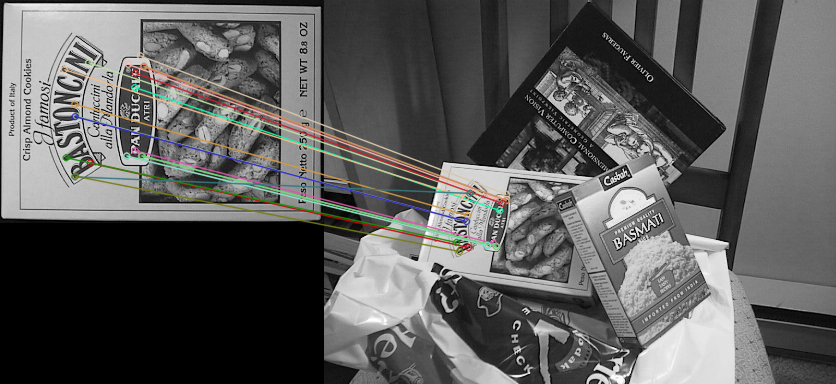

In [ ]:
kp_box1, des_box1 = orb_descriptor(box1, nfeatures=500, scaleFactor=1.2, 
                                   nlevels=8, edgeThreshold=32, firstLevel=0, 
                                   WTA_K=2, scoreType=cv.ORB_HARRIS_SCORE, 
                                   patchSize=31, fastThreshold=20,
                                   display=False)
kp_box2, des_box2 = orb_descriptor(box2, nfeatures=500, scaleFactor=1.2, 
                                   nlevels=8, edgeThreshold=32, firstLevel=0, 
                                   WTA_K=2, scoreType=cv.ORB_HARRIS_SCORE, 
                                   patchSize=31, fastThreshold=20,
                                   display=False)
bf_matcher_orb(box1, box2, 
               kp_box1, kp_box2,
               des_box1, des_box2,
               norm_type=cv.NORM_HAMMING, crossCheck=False,
               n_matches=20)

###### Mountain pair

4.72 ms ± 1.24 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)
3.86 ms ± 27.5 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)
4.73 ms ± 85 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


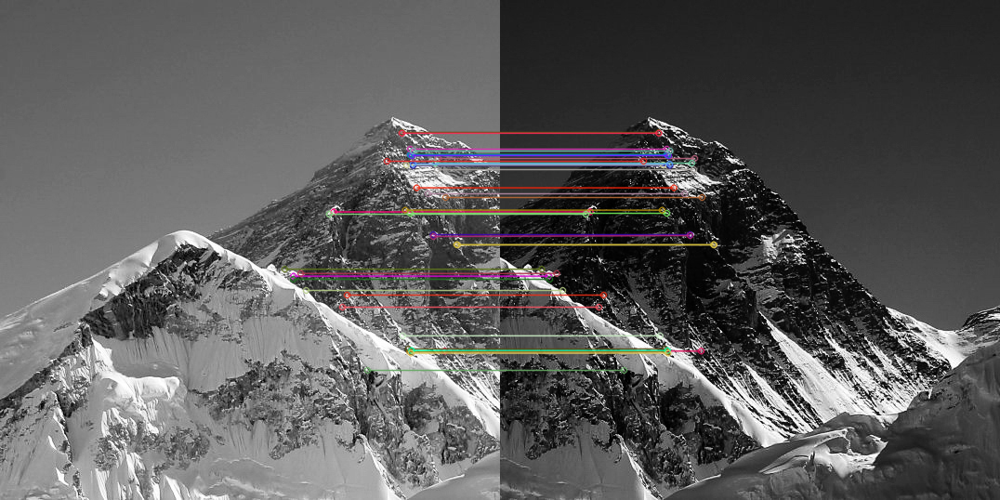

In [ ]:
kp_mtn1, des_mtn1 = orb_descriptor(mountain1, nfeatures=500, scaleFactor=1.2, 
                                   nlevels=8, edgeThreshold=32, firstLevel=0, 
                                   WTA_K=2, scoreType=cv.ORB_HARRIS_SCORE, 
                                   patchSize=31, fastThreshold=20,
                                   display=False)
kp_mtn2, des_mtn2 = orb_descriptor(mountain2, nfeatures=500, scaleFactor=1.2, 
                                   nlevels=8, edgeThreshold=32, firstLevel=0, 
                                   WTA_K=2, scoreType=cv.ORB_HARRIS_SCORE, 
                                   patchSize=31, fastThreshold=20,
                                   display=False)
bf_matcher_orb(mountain1, mountain2, 
               kp_mtn1, kp_mtn2,
               des_mtn1, des_mtn2,
               norm_type=cv.NORM_HAMMING, crossCheck=True,
               n_matches=40)

###### VP pair

9.44 ms ± 2.18 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)
3.98 ms ± 37.6 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)
5.99 ms ± 1.92 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)


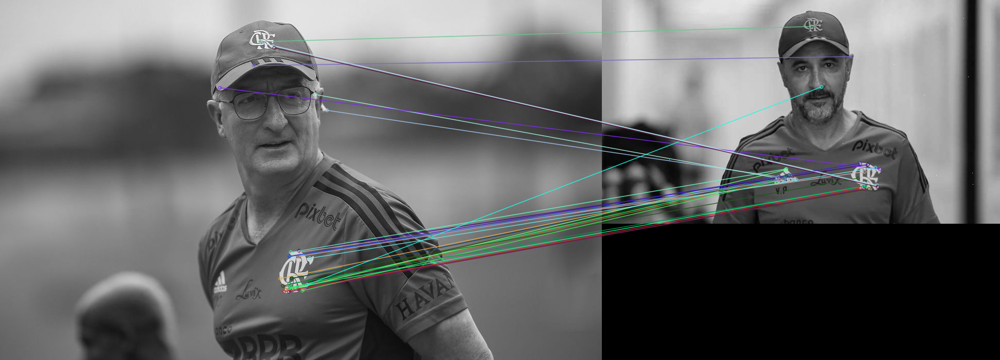

In [ ]:
kp_vp1, des_vp1 = orb_descriptor(vp1, nfeatures=500, scaleFactor=1.2, 
                                 nlevels=8, edgeThreshold=32, firstLevel=0, 
                                 WTA_K=2, scoreType=cv.ORB_HARRIS_SCORE, 
                                 patchSize=31, fastThreshold=20,
                                 display=False)
kp_vp2, des_vp2 = orb_descriptor(vp2, nfeatures=500, scaleFactor=1.2, 
                                 nlevels=8, edgeThreshold=32, firstLevel=0, 
                                 WTA_K=2, scoreType=cv.ORB_HARRIS_SCORE, 
                                 patchSize=31, fastThreshold=20,
                                 display=False)

bf_matcher_orb(vp1, vp2, 
               kp_vp1, kp_vp2,
               des_vp1, des_vp2,
               norm_type=cv.NORM_HAMMING, crossCheck=True,
               n_matches=30)

#### Gerador de correspondências *Brute-Force* com SIFT
**Descrição resumida (até 200 palavras) de como este algoritmo funciona, incluindo seus parâmetros e quais suas principais diferenças:**


O gerador de correspondência Brute-Force é simples, e como o pŕoprio nome já diz, utiliza-se da força bruta. Seleciona-se o descritor de uma das features da primeira imagem e compara com todas as outras da segunda imagem, realizando um cálculo de distância, a de menor distância é retornada. Nesse caso, utilizamos o SIFT para gerar os keypoints e os descritores, já que escolhemos o SIFT, trabalharemos com a norma L2.

Parâmetros:
- Tipo da norma (Hamming, L1, L2)
- Ativação de crossCheck - Se ativo, retorna somente as correspondências com valor $(i, j)$ tal qual o $i$-ésimo descritor de A é a melhor correspondência do $j$-ésimo descritor de B, e vice versa. Promovendo uma maior consistência nos resultados.

In [ ]:
def bf_matcher_sift(img1, img2, kp1, kp2, des1, des2,
                   norm_type=cv.NORM_L2, crossCheck=True, n_matches=20):

  # instancia o Brute-Force Matcher com os seguintes parâmetros
  bf = cv.BFMatcher(norm_type, crossCheck)

  # gera correspondências entre os descritores
  %timeit bf.knnMatch(des1, des2, k=2)
  matches = bf.knnMatch(des1, des2, k=2)
  
  # apply ratio test
  good = []
  for m, n in matches:
      if m.distance < 0.75 * n.distance:
          good.append([m])
  
  # cv.drawMatchesKnn expects list of lists as matches.
  img3 = cv.drawMatchesKnn(img1, kp1, img2, kp2,
                           good[:n_matches], None,
                           flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

  cv2_imshow(img3)

##### Applying it to the images

###### Box pair

19.6 ms ± 947 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)
Foram encontrados 372 descritores de 128 dimensões cada
53.3 ms ± 10.8 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
Foram encontrados 560 descritores de 128 dimensões cada
4.93 ms ± 1.53 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)


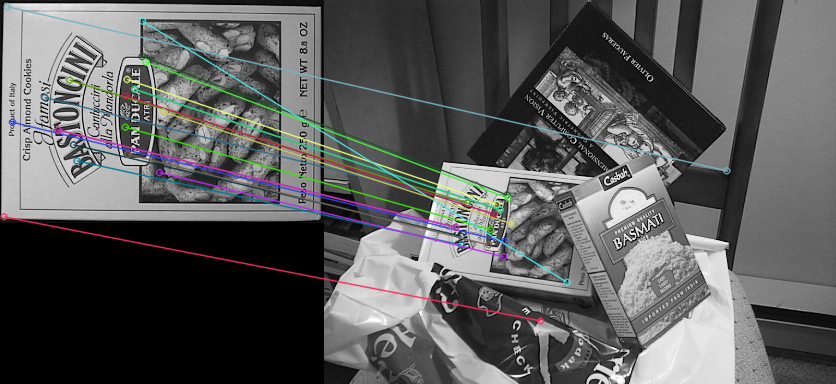

In [ ]:
kp_box1, des_box1 = sift_descriptor(box1, nfeatures=0, nOctaveLayers=3, 
                                    contrastThreshold=0.09, edgeThreshold=10,
                                    sigma=1.6)

kp_box2, des_box2 = sift_descriptor(box2, nfeatures=0, nOctaveLayers=3, 
                                    contrastThreshold=0.09, edgeThreshold=10,
                                    sigma=1.6)
bf_matcher_sift(box1, box2, 
                kp_box1, kp_box2,
                des_box1, des_box2,
                norm_type=cv.NORM_L2, crossCheck=False,
                n_matches=20)

###### Mountain pair

89.4 ms ± 1.15 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
Foram encontrados 621 descritores de 128 dimensões cada
134 ms ± 44.3 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
Foram encontrados 662 descritores de 128 dimensões cada
10.3 ms ± 2.21 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)


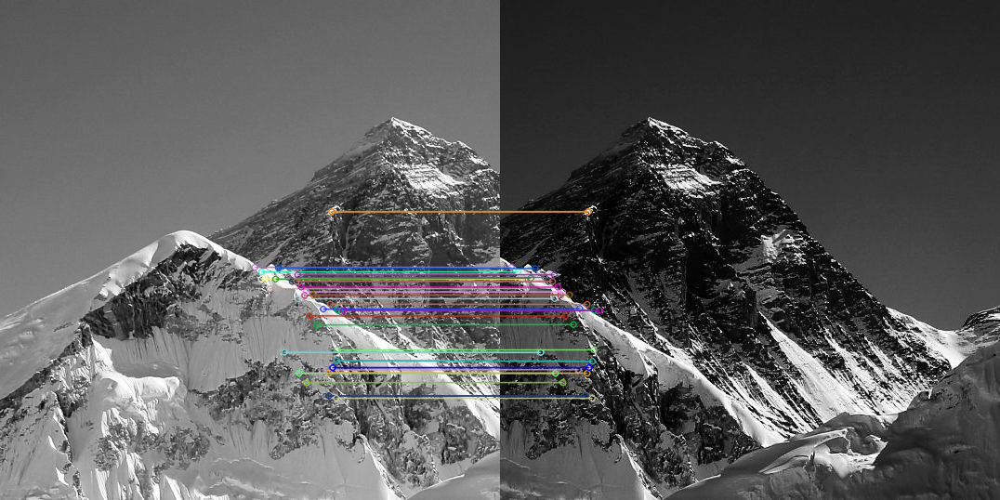

In [ ]:
kp_mtn1, des_mtn1 = sift_descriptor(mountain1, nfeatures=0, nOctaveLayers=7,
                                    contrastThreshold=0.1, edgeThreshold=10,
                                    sigma=2.2)

kp_mtn2, des_mtn2 = sift_descriptor(mountain2, nfeatures=0, nOctaveLayers=7,
                                    contrastThreshold=0.1, edgeThreshold=10,
                                    sigma=2.2)

bf_matcher_sift(mountain1, mountain2, 
                kp_mtn1, kp_mtn2,
                des_mtn1, des_mtn2,
                norm_type=cv.NORM_L2, crossCheck=False,
                n_matches=40)

###### VP pair

176 ms ± 11.5 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
Foram encontrados 215 descritores de 128 dimensões cada
67.5 ms ± 1.2 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
Foram encontrados 278 descritores de 128 dimensões cada
1.22 ms ± 7.63 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


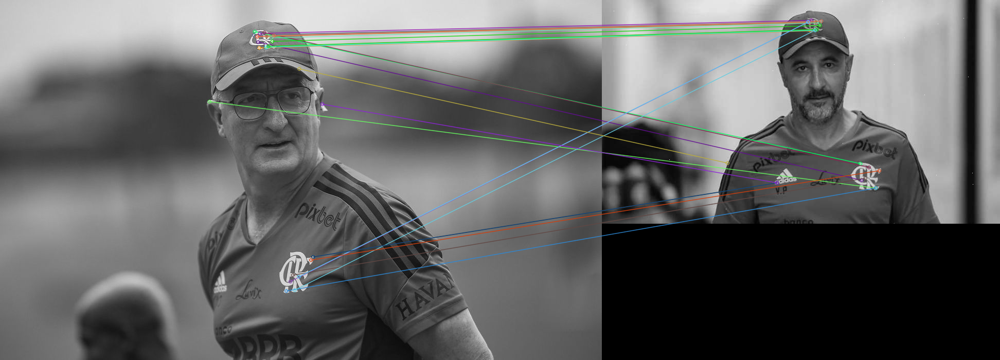

In [ ]:
kp_vp1, des_vp1 = sift_descriptor(vp1, nfeatures=0, nOctaveLayers=5,
                                  contrastThreshold=0.09, edgeThreshold=10,
                                  sigma=1.6)

kp_vp2, des_vp2 = sift_descriptor(vp2, nfeatures=0, nOctaveLayers=5,
                                  contrastThreshold=0.09, edgeThreshold=10,
                                  sigma=1.6)

bf_matcher_sift(vp1, vp2, 
                kp_vp1, kp_vp2,
                des_vp1, des_vp2,
                norm_type=cv.NORM_L2, crossCheck=False,
                n_matches=50)

#### Gerador de correspondências *FLANN (Fast Library for Approximate Nearest Neighbor) based utilizando o SIFT*
**Descrição resumida (até 200 palavras) de como este algoritmo funciona, incluindo seus parâmetros e quais suas principais diferenças:**

FLANN contém uma coleção de algoritmos otimizados para busca de vizinhos mais próximos em grandes conjuntos de dados e para features de alta dimensionalidade. Ele funciona mais rapidamente do que o Brute-Force para grandes conjuntos de dados.

É necessário passar dois dicionários que especificam o algoritmo a ser usado e seus parâmetros. O primeiro é o IndexParams, que determina o tipo de indexação. Ele vai variar dependendo do tipo de algoritmo utilizado na descrição: LSH(Locality-sensitive hashing) para ORB e Árvore k-d para SIFT, o que iremos utilizar nesse exemplo.

O segundo dicionário é o SearchParams. Ele especifica o número de vezes que as árvores no índice devem ser percorridas recursivamente. Valores mais altos oferecem melhor precisão, mas também levam mais tempo.

Parâmetros:
- Dicionário com os parâmetros de indexação
- Dicionário com os parâmetros de busca

In [ ]:
def flann_matcher_sift(img1, img2, kp1, kp2, des1, des2,
                       index_params, search_params):

  # instancia o FLANN Matcher com os seguintes parâmetros
  flann = cv.FlannBasedMatcher(index_params, search_params)

  # gera correspondências entre os descritores
  %timeit flann.match(des1, des2)
  matches = flann.match(des1, des2)

  # ordena em relação a sua distância para podermos desenhar um número limitado
  matches = flann.knnMatch(des1, des2, k=2)
  
  # need to draw only good matches, so create a mask
  matchesMask = [[0,0] for i in range(len(matches))]
  
  # ratio test as per Lowe's paper
  for i,(m,n) in enumerate(matches):
      if m.distance < 0.7*n.distance:
          matchesMask[i]=[1,0]
  
  draw_params = dict(matchColor = (0,255,0),
                     singlePointColor = (0, 0, 255),
                     matchesMask = matchesMask,
                     flags = cv.DrawMatchesFlags_DEFAULT)

  # desenha as correspondências
  img3 = cv.drawMatchesKnn(img1, kp1, img2, kp2,
                           matches,
                           None,
                           **draw_params)

  cv2_imshow(img3)

##### Applying it to the images

###### Box pair

25.2 ms ± 6.18 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
Foram encontrados 372 descritores de 128 dimensões cada
47.4 ms ± 447 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)
Foram encontrados 560 descritores de 128 dimensões cada
9.9 ms ± 1.12 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)


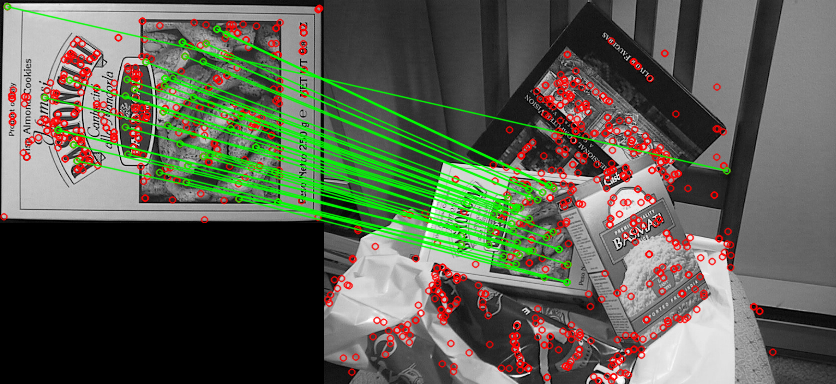

In [ ]:
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)

kp_box1, des_box1 = sift_descriptor(box1, nfeatures=0, nOctaveLayers=3, 
                                    contrastThreshold=0.09, edgeThreshold=10,
                                    sigma=1.6)

kp_box2, des_box2 = sift_descriptor(box2, nfeatures=0, nOctaveLayers=3, 
                                    contrastThreshold=0.09, edgeThreshold=10,
                                    sigma=1.6)

flann_matcher_sift(box1, box2,
                   kp_box1, kp_box2,
                   des_box1, des_box2,
                   index_params, search_params)

###### Mountain pair

94.3 ms ± 1.42 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
Foram encontrados 621 descritores de 128 dimensões cada
105 ms ± 13.5 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
Foram encontrados 662 descritores de 128 dimensões cada
15 ms ± 1.19 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)


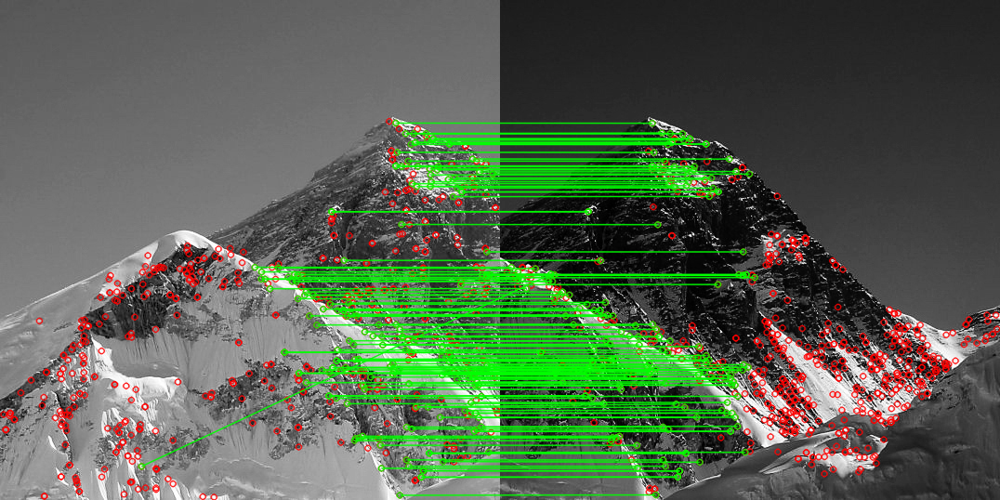

In [ ]:
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)

kp_mtn1, des_mtn1 = sift_descriptor(mountain1, nfeatures=0, nOctaveLayers=7,
                                    contrastThreshold=0.1, edgeThreshold=10,
                                    sigma=2.2)

kp_mtn2, des_mtn2 = sift_descriptor(mountain2, nfeatures=0, nOctaveLayers=7,
                                    contrastThreshold=0.1, edgeThreshold=10,
                                    sigma=2.2)

flann_matcher_sift(mountain1, mountain2,
                   kp_mtn1, kp_mtn2,
                   des_mtn1, des_mtn2,
                   index_params, search_params)

###### VP pair

177 ms ± 6.22 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
Foram encontrados 215 descritores de 128 dimensões cada
76.6 ms ± 8.59 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
Foram encontrados 278 descritores de 128 dimensões cada
4.96 ms ± 71.6 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


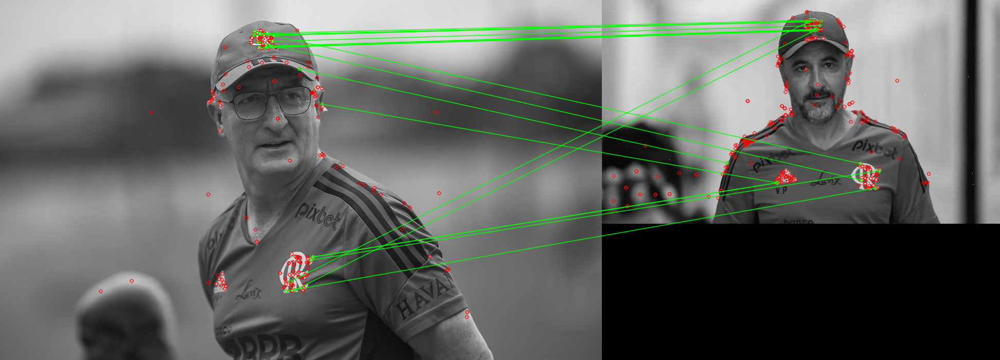

In [ ]:
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)

kp_vp1, des_vp1 = sift_descriptor(vp1, nfeatures=0, nOctaveLayers=5,
                                  contrastThreshold=0.09, edgeThreshold=10,
                                  sigma=1.6)

kp_vp2, des_vp2 = sift_descriptor(vp2, nfeatures=0, nOctaveLayers=5,
                                  contrastThreshold=0.09, edgeThreshold=10,
                                  sigma=1.6)

flann_matcher_sift(vp1, vp2,
                   kp_vp1, kp_vp2,
                   des_vp1, des_vp2,
                   index_params, search_params)

### Discussão
Exiba resultados nas suas imagens, e em quais situações cada um funciona bem ou mal. Discuta seus parâmetros. Qual deles você achou melhor? Justifique.

Nessa questão resolvemos algumas pendências das questões anteriores, mais especificamente iremos poder comparar a eficácia de alguns algoritmos.

**Quais situações cada um funciona bem ou mal:**
- **Force-Brute com ORB:** Algumas limitações tem mais a ver com o tipo do descritor utilizado do que com o gerador de correspondências em si. Mas pudemos notar que algoritmos de força bruta precisam de menos parâmetros e são mais simples do que o FLANN, sendo assim funcionam bem para situações simples, e para bases maiores com um número significativo de descritores, o de força bruta já não deve caber mais, preferindo assim um FLANN.
- **Force-Brute com SIFT:** Bem similar ao anterior, única diferênça é o SIFT no lugar do ORB, e as diferenças entre eles foram listadas na Questão 2. Uma última observação é que entre os dois, achei as features detectadas pelo SIFT mais fáceis de entender visualmente, e de explicar o porquê ela é uma feature importante.
- **FLANN com SIFT:** Funciona bem em situações com restrições de tempo de execução, talvez se espaço e tempos forem algo crítico, FLANN com ORB utilizando FAST *corner score* tenha um desempenho melhor. Mas em termos de percepção visual das features e quantidade de outliers, FLANN com SIFT me pareceu funcionar melhor do que os demais, 

**Discussão de parâmetros:**
- **Force-Brute com ORB:** possui poucos parâmetros, o primeiro (tipo da norma) é definido pelo tipo de algoritmo utilizado para calcular os descritores, como escolhemos o ORB aqui, tivemos que usar Hamming. O segundo é o *cross checking*, que utilizamos para obter resultados mais robustos, algo curioso é que obtivemos melhores resultados no primeiro par de imagens (caixa) com o *cross cheking* desativado. A principio notamos que os parâmetros utilizados no ORB da questão 2 gerou correspondências bem ruins, e valores próximos ao sugerido pelo autor gerou relativamente boas correspondências, mesmo que visualmente as suas features pareçam menos significativas e até mesmo erradas.
- **Force-Brute com SIFT:** Similar ao anterior, mas utilizando o descritor e detector SIFT, daí utilizamos a norma L2 e *cross checking* desativado devido a uma restrição do OpenCV ao se utilizar o knnMatch.
- **FLANN com SIFT:** Possui dois dicionários como parâmetros, o primeiro varia em relação ao tipo de descritor utilizado, como escolhemos SIFT, especificamos os parâmetros da indexação em árvore. O segundo determina a profundidade da árvore, quanto maior mais precisão teremos, mas aumentará o tempo de execução. Testamos também o FLANN com o ORB e preferimos o resultado do SIFT, além da questão dos parâmetros e da facilidade do entendimento visual. Variamos os parâmetros do dicionário, aumentando ou diminuindo a profundidade da árvore, contudo notamos pouca ou nenhuma diferença nos resultados obtidos, talvez os exemplos escolhidos não conseguiram representar essa variação.

**Qual achei melhor:**
FLANN com SIFT me pareceu ter resultados melhores, as discussões trazidas na Questão 1 e 2 ainda são válidas aqui no que diz respeito a robustez e restrições da aplicação. 


# Questão 4


Escolha e descreva uma metodologia completa para geração de correspondências. Experimente 3 quantidades distintas de correspondências retornadas, variando parâmetros dos algoritmos. Aplique esta metodologia em duas imagens, exiba e discuta a qualidade dos resultados (correspondências corretas vs. outliers). Estes resultados devem ser exibidos com segmentos de reta entre imagens representando suas correspondências.

## Descrição: ORB + força bruta

O primeiro passo é detectar os pontos chave da imagem. O ORB usa um método FAST (Features from Accelerated Segment Test) para detectá-los de forma rápida e eficiente. O FAST avalia a intensidade dos pixels ao redor de um ponto e determina se o ponto é uma transição de pixel rápida, isto é, se é candidato a ponto chave. O ORB também utiliza uma técnica para detectar a orientação do ponto chave, de modo que os descritores possam ser calculados com base nessa orientação.

Depois de detectar os pontos chave, o ORB extrai um descritor para cada ponto chave. O ORB utiliza um método BRIEF (Binary Robust Independent Elementary Features) para extrair descritores de forma eficiente, que gera um conjunto de bits binários que descrevem as diferenças de intensidade entre pares de pontos vizinhos ao redor do ponto chave.

Uma vez extraídos os descritores de ambas as imagens que estão sendo comparadas, o próximo passo é encontrar correspondências entre os pontos chave das duas imagens. Como já citado na questão anterior, ao usar força bruta é selecionado um descritor de uma das features da primeira imagem e este é comparado com todas as outras features da segunda imagem, realizando um cálculo de distância, a de menor distância é retornada. 
Nesta questão, analisaremos as diferenças entre  as imagens resultantes de ao usar três normalizações distintas (L1, L2 e Hamming) para cálculo dessas distâncias.


## Aplicação

In [ ]:
def detector(image1,image2):

    detect = cv.ORB_create()
  
    key1, desc1 = detect.detectAndCompute(image1,None)
    key2, desc2 = detect.detectAndCompute(image2,None)
    
    return key1, desc1, key2, desc2
 
def BFMatcher(desc1, desc2, norm):

    bf = cv.BFMatcher(norm,crossCheck=True)
    matches = bf.match(desc1,desc2)
 
    return sorted(matches,key=lambda x:x.distance)

def showMatching(path1, path2, nMatches, norm):
  sample1 = cv.imread(path1)
  sample2 = cv.imread(path2)

  key1, desc1, key2, desc2 = detector(sample1, sample2)

  matches = BFMatcher(desc1, desc2, norm) 
  output = cv.drawMatches(sample1, key1, sample2, key2,matches[:nMatches],None,flags=2)

  return plt.imshow(cv.cvtColor(output, cv.COLOR_BGR2RGB))


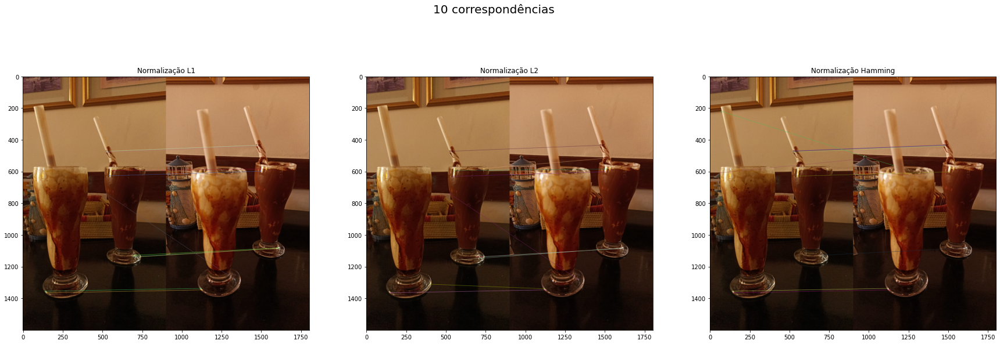

In [ ]:
n = 10
plt.figure(figsize=(30,10))
plt.subplot(131), showMatching('computer-vision/data/frapps1.jpeg', 'computer-vision/data/frapps2.jpeg', n, cv.NORM_L1)
plt.title("Normalização L1")
plt.subplot(132), showMatching('computer-vision/data/frapps1.jpeg', 'computer-vision/data/frapps2.jpeg', n, cv.NORM_L2)
plt.title("Normalização L2")
plt.subplot(133), showMatching('computer-vision/data/frapps1.jpeg', 'computer-vision/data/frapps2.jpeg', n, cv.NORM_HAMMING)
plt.title("Normalização Hamming")

plt.suptitle(f'{n} correspondências', fontsize=20)
plt.show()

**10 correspondências:** Notamos que a normalização L2 obteve melhores resultados,

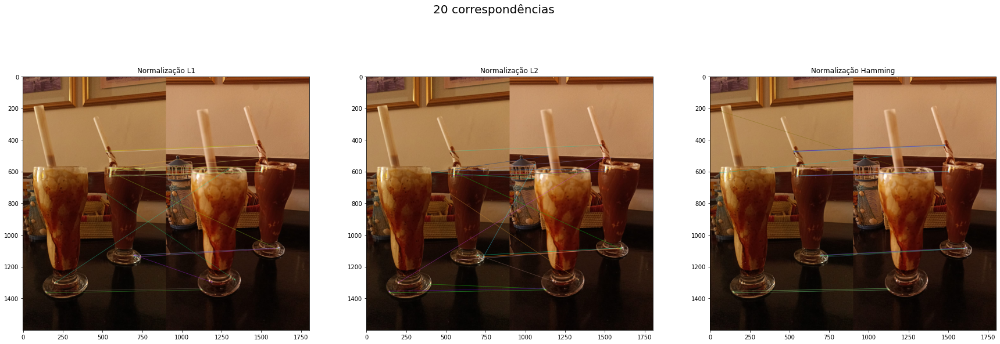

In [ ]:
n = 20
plt.figure(figsize=(30,10))
plt.subplot(131), showMatching('computer-vision/data/frapps1.jpeg', 'computer-vision/data/frapps2.jpeg', n, cv.NORM_L1)
plt.title("Normalização L1")
plt.subplot(132), showMatching('computer-vision/data/frapps1.jpeg', 'computer-vision/data/frapps2.jpeg', n, cv.NORM_L2)
plt.title("Normalização L2")
plt.subplot(133), showMatching('computer-vision/data/frapps1.jpeg', 'computer-vision/data/frapps2.jpeg', n, cv.NORM_HAMMING)
plt.title("Normalização Hamming")

plt.suptitle(f'{n} correspondências', fontsize=20)
plt.show()

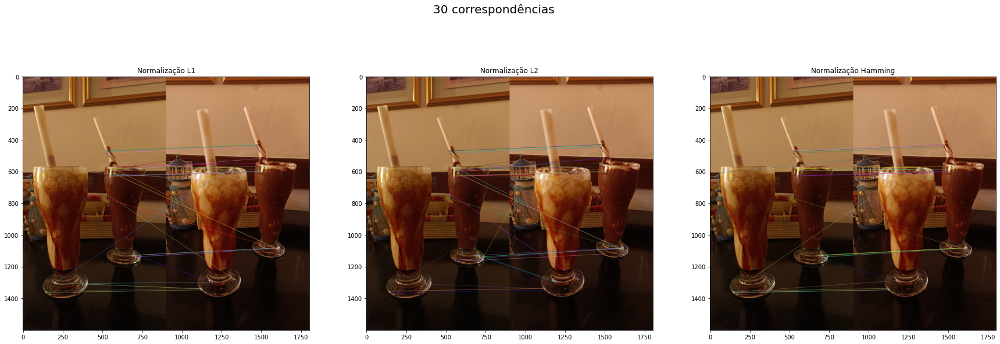

In [ ]:
n = 30
plt.figure(figsize=(30,10))
plt.subplot(131), showMatching('computer-vision/data/frapps1.jpeg', 'computer-vision/data/frapps2.jpeg', n, cv.NORM_L1)
plt.title("Normalização L1")
plt.subplot(132), showMatching('computer-vision/data/frapps1.jpeg', 'computer-vision/data/frapps2.jpeg', n, cv.NORM_L2)
plt.title("Normalização L2")
plt.subplot(133), showMatching('computer-vision/data/frapps1.jpeg', 'computer-vision/data/frapps2.jpeg', n, cv.NORM_HAMMING)
plt.title("Normalização Hamming")

plt.suptitle(f'{n} correspondências', fontsize=20)
plt.show()

## Discussão

Analisando as imagens com 10 correspondências, verificamos que a normalização L1 obteve melhores resultados com apenas 1 outlier, enquanto o modelo com L2 apresentou 3 e o com Hamming 2. No entanto, ao aumentar o número de correspondências para 20 e 30, é notável que a norma de Hammings forneceu resultados mais estáveis em relação a L1 e L2, que se mostraram mais propensas a erro/outliers a medida que o número de correspondências aumentava.

# Questão 5

Aplique o filtro LoG em pelo menos 6 escalas distintas (você pode usar a OpenCV). Em seguida, implemente um algoritmo que determina se um pixel (x, y, s) é um máximo local no espaço de posição escala. Aplique este algoritmo em todos os pixels das imagens resultantes para encontrar estes extremos, e pinte estes pixels de uma cor diferente. Exiba as imagens resultantes. Obs.: você não precisa aplicar na imagem de menor e maior escala, nem nos pixels do bordo da imagem, visto que eles não tem uma vizinhança completa.

In [ ]:
def LoG(img, k, sd):

    blur = cv.GaussianBlur(img,(k, k), sd)
    return cv.Laplacian(blur,cv.CV_64F)

def extremes(sample, scales, threshold):

  extreme_imgs = []

  for k in range(scales):
      extremes = []
      img = LoG(sample, 2*k + 1,0)

      maxima = cv.dilate(img, np.ones((k, k)))

      mask = np.zeros_like(img, np.uint8)
      mask[img > threshold] = 255
      mask[maxima != img] = 0
      indices = np.argwhere(mask > 0)
      for index in indices:
          extremes.append((index[0], index[1], k))

      for item in extremes:
          cv.circle(img, (item[1], item[0]), item[2], (0, 255, 0), thickness=1)

      extreme_imgs.append(img)

  return extreme_imgs     


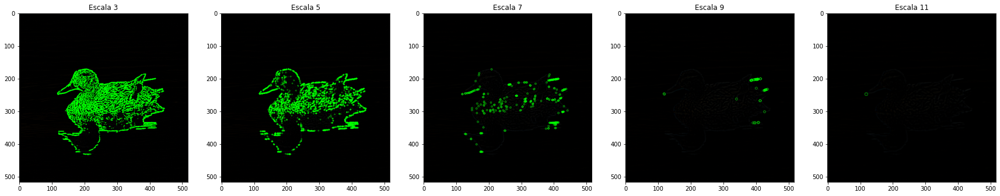

In [ ]:
img = cv.imread('computer-vision/data/patinho.png')
extreme_imgs = extremes(img, 7, 20)
plt.figure(figsize=(30, 10))
k = 1
for i in range(1, len(extreme_imgs) - 1):
  plt.subplot(150 + i), plt.imshow(extreme_imgs[i]/255)
  plt.title(f"Escala {1 +  2 * k}")
  k+=1

plt.show()